# Packages

In [178]:
import os
import cv2
import time
import tqdm
import numpy as np
import matplotlib.pyplot as plt

In [179]:
import nibabel as nib
import perlin_noise

In [180]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.init as init
import torch.nn.functional as F

In [181]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

In [182]:
import torchvision
import torchvision.transforms

In [183]:
from torchsummary import summary

In [184]:
path_testing = "../Database/testing/"
path_training = "../Database/training/"
path_tmpdata = "../TMP/"
path_results = "../Results/"

In [185]:
Path = []
Path.append(path_testing)
Path.append(path_training)



# Useful Functions

### Data get functions

In [186]:
HEADER = ["Name", "Dice LV", "Volume LV", "Err LV(ml)",
          "Dice RV", "Volume RV", "Err RV(ml)",
          "Dice MYO", "Volume MYO", "Err MYO(ml)"]

def load_nii(img_path):
    nimg = nib.load(img_path)
    return nimg.get_fdata(), nimg.affine, nimg.header


def save_nii(img_path, data, affine, header):
    nimg = nib.Nifti1Image(data, affine=affine, header=header)
    nimg.to_filename(img_path)

### Noise functions

In [187]:
def add_noise_Gaussian(img):
    noise = 10*np.random.rand() + 100*np.random.rand()*np.random.rand(img.shape[0], img.shape[1])
    img_noisy = img + noise
    return img_noisy


def add_noise_SaltPepper(img):
    pic = np.zeros(img.shape)
    prob = np.random.rand() * 0.1
    thresh = 1 - prob 
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            p = np.random.rand()
            if p < prob:
                pic[i][j] = 0
            elif p > thresh:
                pic[i][j] = 255
            else:
                pic[i][j] = img[i][j]
    return pic


def add_noise_Poisson(img):
    noise = np.random.poisson(img)
    img_noisy = img + noise
    return img_noisy


def add_noise_Poisson2(img):
    noise = np.sqrt(img) * np.random.normal(0, 1, img.shape)
    img_noisy = img + noise
    return img_noisy


def add_noise_Perlin(img):
    noise1 = perlin_noise.PerlinNoise(octaves=3)
    noise2 = perlin_noise.PerlinNoise(octaves=6)
    noise3 = perlin_noise.PerlinNoise(octaves=12)
    noise4 = perlin_noise.PerlinNoise(octaves=24)

    h, w = img.shape[0], img.shape[1]
    pic = np.zeros((h,w))
    for i in range(h):
        for j in range(w):
            noise_val =  np.random.rand() * noise1([i/h, j/w])
            noise_val += np.random.rand() * noise2([i/h, j/w])
            noise_val += np.random.rand() * noise3([i/h, j/w])
            noise_val += np.random.rand() * noise4([i/h, j/w])

            pic[i,j] = np.max(img)/(2*np.random.rand()+3) * noise_val

    img_noisy = pic + img
    return img_noisy


def add_noise_Speckle(img):
    gauss = np.random.randn(img.shape[0],img.shape[1]).reshape(img.shape[0],img.shape[1])      
    img_noisy = img + img * gauss
    return img_noisy


def add_noise_Speckle2(img):
    gauss = np.random.normal(0,1,img.shape).reshape(img.shape[0],img.shape[1])     
    img_noisy = img + img * gauss
    return img_noisy

### Add noise functions

In [188]:
def add_noise(img,p):
    if p < 0.2:
        Img = add_noise_Gaussian(img)
    elif (p>=0.2 and p < 0.4):
        Img = add_noise_SaltPepper(img)
    elif (p>=0.4 and p < 0.6):
        Img = add_noise_Poisson2(img)
    elif (p>=0.6 and p < 0.8):
        Img = add_noise_Perlin(img)
    else:
        Img = add_noise_Speckle(img)
        
    return Img


def add_noise2(inputs, p):
    if p < 0.25:
        targets = add_noise_Gaussian(inputs)
    elif (p >= 0.25 and p < 0.5):
        targets = add_noise_Gaussian(inputs)
    elif (p >= 0.5 and p < 0.75):
        targets = add_noise_Gaussian(inputs)
    else:
        targets = add_noise_Gaussian(inputs)
        
    return targets


def add_noise3(inputs,noise_factor):
    noisy = inputs + torch.randn(inputs.shape) * noise_factor
    noisy = torch.clip(noisy, 0., 1.)
    
    return noisy

# Data Tests

(232, 256, 10)


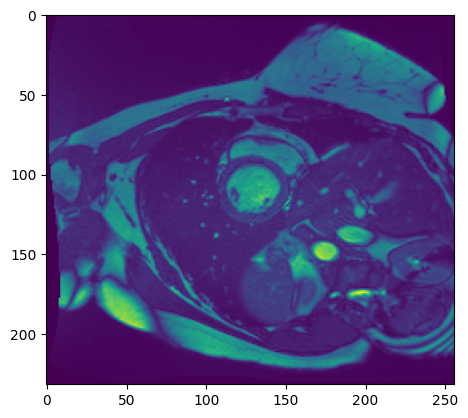

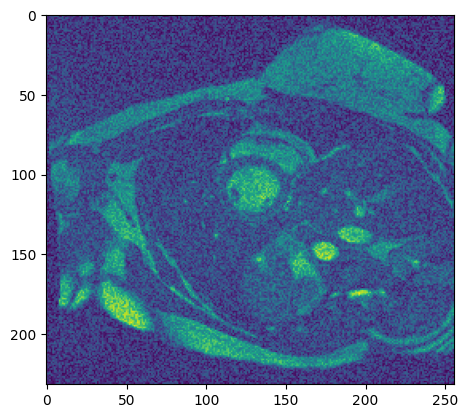

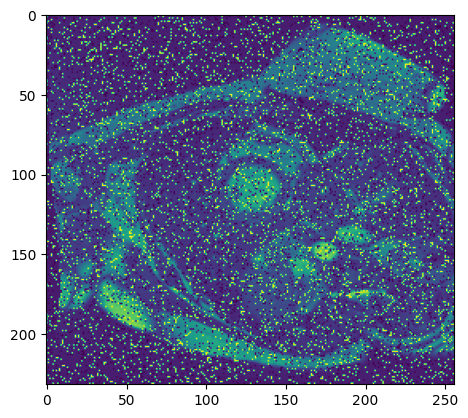

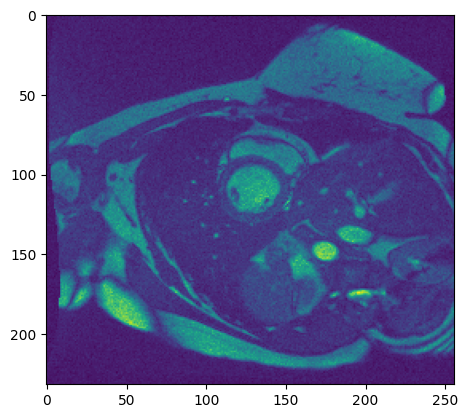

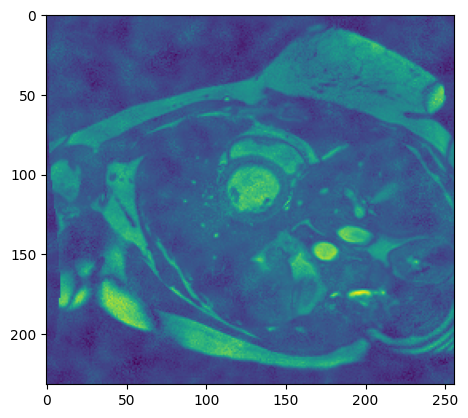

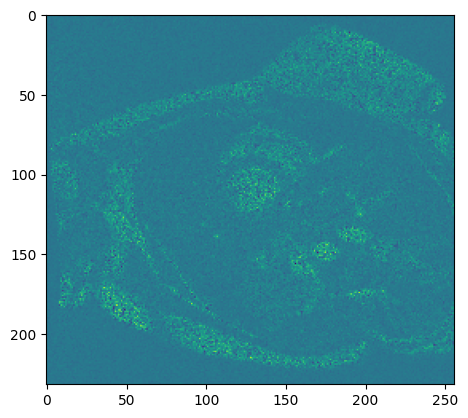

In [158]:
# Load the frame
im, affine, header = load_nii(os.path.join(path_testing, "patient101/patient101_frame14.nii.gz"))
print(im.shape)

# Show one slice (or all of them) of the frame 
im = im[:,:,3]
plt.imshow(im)
plt.show()
# for i in range(im.shape[2]):
#     plt.imshow(im[:,:,i])
#     plt.show()

# Add a gaussian noise to this frame
Im = add_noise_Gaussian(im)
plt.imshow(Im)
plt.show()

# Add a salt & pepper noise to the frame
Im = add_noise_SaltPepper(im)
plt.imshow(Im)
plt.show()

# Add a poisson noise to the frame
Im = add_noise_Poisson2(im)
plt.imshow(Im)
plt.show()

# Add a perlin noise to the frame
Im = add_noise_Perlin(im)
plt.imshow(Im)
plt.show()

# Add a speckle noise to the frame
Im = add_noise_Speckle(im)
plt.imshow(Im)
plt.show()

# Data Generation

### Dataset class

In [159]:
class cleanDataset(Dataset):

  def __init__(self,datasetclean,transform):
    self.clean = datasetclean
    self.transform = transform
  
  def __len__(self):
    return len(self.clean)
  
  def __getitem__(self,idx):
    xClean = self.clean[idx]
    
    if self.transform != None:
      xClean = self.transform(xClean)
    
    return (xClean)
  
  
class noisedDataset(Dataset):
    
  def __init__(self,datasetnoised,datasetclean,transform):
    self.noise = datasetnoised
    self.clean = datasetclean
    self.transform = transform
  
  def __len__(self):
    return len(self.noise)
  
  def __getitem__(self,idx):
    xNoise = self.noise[idx]
    xClean = self.clean[idx]
    
    if self.transform != None:
      xNoise = self.transform(xNoise)
      xClean = self.transform(xClean)
    
    return (xNoise, xClean)

### Database modification

In [160]:
def add_noisedData():
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):
                    if files.startswith(file + "_frame") and files.endswith('gt.nii.gz') == False:
                        
                        im, affine, header = load_nii(os.path.join(path, file + "/" + files))
                        
                        path_OutputFile = path + file + "/" + "noisy_" + files
                        
                        for i in range(im.shape[2]):
                            p = np.random.rand()
                            im[:,:,i] = add_noise2(im[:,:,i], p)
                        
                        save_nii(path_OutputFile, im, affine, header)

def remove_noisedData():
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):         
                    if files.startswith('noisy'):
                        os.remove(os.path.join(path, file + "/" + files))

### Get the parameters of the data

In [161]:
def init_parameters():
    h_max = 0
    w_max = 0
    n  = 0
    n2 = 0
    n_tot  = 0
    n_tot2 = 0
    
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):
                    if files.startswith(file + "_frame") and files.endswith('gt.nii.gz') == False:
                        
                        im, _, _ = load_nii(os.path.join(path, file + "/" + files))
                        
                        if im.shape[0] > h_max:
                            h_max = im.shape[0]
                            
                        if im.shape[1] > w_max:
                            w_max = im.shape[1]
                        
                        if path == path_testing:
                            n += 1
                            n_tot += im.shape[2]
                        else:
                            n2 += 1
                            n_tot2 += im.shape[2]
                            
    n_tot3 = int(n_tot/3)
    n_tot = n_tot - n_tot3
    
    if h_max < w_max:
        h_max = w_max

    return h_max, n_tot, n_tot2, n_tot3

### Create the data arrays

In [162]:
def create_arraySet(size, test):
    
    h_max, n_tot, n_tot2, n_tot3 = init_parameters()
    w_max = h_max
    
    if size != 0:
        h_max = size
        w_max = size

    TEdata = np.zeros((n_tot, h_max, w_max))  # n_size / n_line / n_col
    TRdata = np.zeros((n_tot2, h_max, w_max))
    VAdata = np.zeros((n_tot3, h_max, w_max))
    
    if test == 'noisy':
        remove_noisedData()
        add_noisedData()
        
        TEnoisedData    = np.zeros((n_tot, h_max, w_max))
        TRnoisedData    = np.zeros((n_tot2, h_max, w_max))    
        VAnoisedData    = np.zeros((n_tot3, h_max, w_max))

    m_TE = 0
    m_TR = 0
    m_VA = 0
    m_TEnoised = 0
    m_TRnoised = 0
    m_VAnoised = 0

    counter  = 0
    counter2 = 0

    T = torchvision.transforms.ToTensor()

    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):           
                    if (files.startswith(file + "_frame") or files.startswith('noisy')) and files.endswith('gt.nii.gz') == False:
                        
                        im, _, _ = load_nii(os.path.join(path, file + "/" + files))
                        
                        for k in range(im.shape[2]):
                    
                            Im = im[:,:,k].copy()
                            
                            if Im.shape[0] != h_max or Im.shape[1] != w_max:
                                Im = torchvision.transforms.Resize((h_max,w_max))(T(Im))
                                Im = np.moveaxis(Im.numpy()*255, 0, -1).squeeze()                        
                        
                            if files.startswith(file + "_frame"):
                                if path == path_testing and counter < n_tot3:
                                    VAdata[m_VA,:,:] = Im
                                    m_VA    += 1
                                    counter += 1
                                elif path == path_training:
                                    TRdata[m_TR,:,:] = Im
                                    m_TR += 1
                                else:
                                    TEdata[m_TE,:,:] = Im
                                    m_TE += 1
                                        
                            else:
                                if test == 'noisy':
                                    if path == path_testing and counter2 < n_tot3:
                                        VAnoisedData[m_VAnoised,:,:] = Im
                                        m_VAnoised += 1
                                        counter2   += 1
                                    elif path == path_training:
                                        TRnoisedData[m_TRnoised,:,:] = Im
                                        m_TRnoised += 1  
                                    else:
                                        TEnoisedData[m_TEnoised,:,:] = Im
                                        m_TEnoised += 1 
    
    if test == 'noisy':                      
        return TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData
    
    return TEdata, TRdata, VAdata

### Create the data set / loader

In [163]:
def create_dataSet(size, test):
        
    transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
    
    if test == 'noisy':
        TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData = create_arraySet(size, test)
        
        TEnoisedSet = noisedDataset(TEnoisedData, TEdata, transforms)
        TRnoisedSet = noisedDataset(TRnoisedData, TRdata, transforms)
        VAnoisedSet = noisedDataset(VAnoisedData, VAdata, transforms)
        
        return TEnoisedSet, TRnoisedSet, VAnoisedSet
        
    TEdata, TRdata, VAdata = create_arraySet(size, test)

    TEset = cleanDataset(TEdata, transforms)
    TRset = cleanDataset(TRdata, transforms)
    VAset = cleanDataset(VAdata, transforms)        
    
    return TEset, TRset, VAset


def create_dataLoader(size, test, batch_size):
    
    if test == 'noisy':
        TEnoisedSet, TRnoisedSet, VAnoisedSet = create_dataSet(size, test)
        
        TEnoisedLoader = DataLoader(TEnoisedSet, batch_size=batch_size, shuffle=True)
        TRnoisedLoader = DataLoader(TRnoisedSet, batch_size=batch_size, shuffle=True)
        VAnoisedLoader = DataLoader(VAnoisedSet, batch_size=batch_size, shuffle=True)
        
        return None, None, None, TEnoisedLoader, TRnoisedLoader, VAnoisedLoader
    
    TEset, TRset, VAset = create_dataSet(size, test)
        
    TEloader = DataLoader(TEset, batch_size=batch_size, shuffle=True)
    TRloader = DataLoader(TRset, batch_size=batch_size, shuffle=True)
    VAloader = DataLoader(VAset, batch_size=batch_size, shuffle=True)
    
    return TEloader, TRloader, VAloader, None, None, None

### Save / Load the data arrays

In [164]:
def save(TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData):
    np.save(os.path.join(path_tmpdata, "TEdata.npy"), TEdata)
    np.save(os.path.join(path_tmpdata, "TRdata.npy"), TRdata)
    np.save(os.path.join(path_tmpdata, "VAdata.npy"), VAdata)
    np.save(os.path.join(path_tmpdata, "TEnoisedData.npy"), TEnoisedData)
    np.save(os.path.join(path_tmpdata, "TRnoisedData.npy"), TRnoisedData)
    np.save(os.path.join(path_tmpdata, "VAnoisedData.npy"), VAnoisedData)
    

def load():
    TEdata = np.load(os.path.join(path_tmpdata, "TEdata.npy"), allow_pickle=True)
    TRdata = np.load(os.path.join(path_tmpdata, "TRdata.npy"), allow_pickle=True)
    VAdata = np.load(os.path.join(path_tmpdata, "VAdata.npy"), allow_pickle=True)
    TEnoisedData = np.load(os.path.join(path_tmpdata, "TEnoisedData.npy"), allow_pickle=True)
    TRnoisedData = np.load(os.path.join(path_tmpdata, "TRnoisedData.npy"), allow_pickle=True)
    VAnoisedData = np.load(os.path.join(path_tmpdata, "VAnoisedData.npy"), allow_pickle=True)
    
    return TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData

# Neural network
## Step 1

### GPU / CPU initialisation

In [165]:
if torch.cuda.is_available():
    print('use cuda')
    device = torch.device('cpu')
else:
    print('use CPU')
    device = torch.device('cpu')

use cuda


In [166]:
torch.cuda.empty_cache()
torch.cuda.get_device_name(0)
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |

### Auto-Encoder

In [167]:
class AEnet(nn.Module):
    """Auto-Encoder network"""
    def __init__(self):
        super(AEnet, self).__init__()
        self.name = 'autoencoder'
                
        Kernel = 3
        Padding = 1 #int((Kernel-1)/2)
        Stride = 1
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1,64,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64,32,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32,16,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(16,8,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            
            # nn.Flatten(start_dim=1),
            # nn.Linear(8*32*32, 2048),
            # nn.ReLU(True),
            # nn.Linear(2048, 512)
        )
        
        
        self.decoder = nn.Sequential(
            # nn.Linear(512, 2048),
            # nn.ReLU(True),
            # nn.Linear(2048  , 8*32*32),
            # nn.Unflatten(dim=1,unflattened_size=(8,32,32)),
            
            nn.ConvTranspose2d(8,8,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(8,16,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(16,32,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(32,64,2,stride=2),
            nn.ReLU(True),
            nn.Conv2d(64,1,Kernel,Stride,Padding),
            nn.Sigmoid()
        )
    
    def forward(self,x):
        x = self.encoder(x)
        x = self.decoder(x)
        
        return x     

### Network test

In [168]:
net = AEnet()

size = 512
summary(net, (1, size, size), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]             640
              ReLU-2         [-1, 64, 512, 512]               0
         MaxPool2d-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 32, 256, 256]          18,464
              ReLU-5         [-1, 32, 256, 256]               0
         MaxPool2d-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 16, 128, 128]           4,624
              ReLU-8         [-1, 16, 128, 128]               0
         MaxPool2d-9           [-1, 16, 64, 64]               0
           Conv2d-10            [-1, 8, 64, 64]           1,160
             ReLU-11            [-1, 8, 64, 64]               0
        MaxPool2d-12            [-1, 8, 32, 32]               0
  ConvTranspose2d-13            [-1, 8, 64, 64]             264
             ReLU-14            [-1, 8,

## Step 2
### Train

In [169]:
def count_parameters(model):
    return (sum([p.numel() for p in model.parameters() if p.requires_grad]))

def init_params(net):
    '''Init layer parameters.'''
    for m in net.modules():
        if isinstance(m, nn.Conv2d):
            init.kaiming_normal_(m.weight, mode='fan_out')
            
        elif isinstance(m, nn.BatchNorm2d):
            init.constant_(m.weight, 1)
            init.constant_(m.bias, 0)
            
        elif isinstance(m, nn.Linear):
            init.normal_(m.weight, std=1e-3)
            init.constant_(m.bias, 0) 

In [170]:
def normalize(inputs):
    flattened_outmap = inputs.view(inputs.shape[0], -1, 1, 1) # Use 1's to preserve the number of dimensions for broadcasting later, as explained
    outmap_min, _ = torch.min(flattened_outmap, dim=1, keepdim=True)
    outmap_max, _ = torch.max(flattened_outmap, dim=1, keepdim=True)
    inputs = (inputs - outmap_min) / (outmap_max - outmap_min)
    return inputs


def plot(inputs, size, test_img, idx, axe, i):
    inputs = inputs[test_img[idx],:,:]
    
    inputs = inputs.view(1,size,size)
    inputs = inputs.permute(1,2,0).squeeze(2)
    inputs = inputs.detach().cpu().numpy()
    
    axe[idx,i].imshow(inputs, cmap="gray")
    
    
def plot_ae_outputs_den(net, testingLoader, testingLoader_noisy, size, n, n_tot3, batch_size, test, noise_factor):
    
    _, axes = plt.subplots(n,3,figsize=(10,10))
    axes[0,0].set_title("Original Image")
    axes[0,1].set_title("Dirty Image")
    axes[0,2].set_title("Cleaned Image")

    test_imgs  = np.random.randint(0,int(n_tot3/batch_size),size=n)
    test_imgs2 = np.random.randint(0,batch_size-1,size=n)

    for idx in range((n)):
        count = 0
        
        if test == 'noisy':
            for inputs, targets in testingLoader_noisy:
                if test_imgs[idx] == count:
                    
                    inputs  = normalize(inputs)
                    targets = normalize(targets)
        
                    inputs  = inputs.type(torch.FloatTensor)
                    targets = targets.type(torch.FloatTensor)
                    
                    net.eval()
                    
                    with torch.no_grad():
                        outputs = net(targets)
                        break
            
                count += 1
                
        else:
            for inputs in testingLoader:
                if test_imgs[idx] == count:
                    
                    inputs  = normalize(inputs)
                    targets = add_noise3(inputs, noise_factor)
        
                    inputs  = inputs.type(torch.FloatTensor)
                    targets = targets.type(torch.FloatTensor)
                    
                    net.eval()
                    
                    with torch.no_grad():
                        outputs = net(targets)
                        break
            
                count += 1

        plot(inputs, size, test_imgs2, idx, axes, 0)
        plot(targets, size, test_imgs2, idx, axes, 1)
        plot(outputs, size, test_imgs2, idx, axes, 2)

    plt.show()

#### Training function

In [171]:
def training(net, TRloader, TRnoisedLoader, criterion, optimizer, test, noise_factor, losses_TRAll):
    
    net.train()
    
    # lr = lr0 * lr_gamma**int(epoch/lr_step)
    # optimizer.lr = lr
    # print (lr)
    
    TRlosses  = []
    start = time.time()

    if test == 'noisy':
        for inputs, targets in tqdm.tqdm((TRnoisedLoader)):
        
            inputs  = normalize(inputs)
            targets = normalize(targets)
            
            inputs  = inputs.type(torch.FloatTensor)
            targets = targets.type(torch.FloatTensor)
            
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = net(targets)
            loss = criterion(outputs, inputs)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            TRlosses.append(loss.data.item())
            losses_TRAll.append(loss.data.item())
            
    else:
        for inputs in tqdm.tqdm((TRloader)):
        
            inputs  = normalize(inputs)
            targets = add_noise3(inputs, noise_factor)
            
            inputs  = inputs.type(torch.FloatTensor)
            targets = targets.type(torch.FloatTensor)
            
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = net(targets)
            loss = criterion(outputs, inputs)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            TRlosses.append(loss.data.item())
            losses_TRAll.append(loss.data.item())
        
    end = time.time()
    
    return TRlosses, end-start

#### Validation function

In [172]:
def validation(net, VAloader, VAnoisedLoader, criterion, test, noise_factor):
    
    # Evaluate the current network on the validation dataset
    net.eval()

    VAlosses = []
    start = time.time()
    
    with torch.no_grad():
        
        if test == 'noisy':    
            for inputs, targets in tqdm.tqdm((VAnoisedLoader)):
                
                inputs  = normalize(inputs)
                targets = normalize(targets)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(targets)
                
                loss = criterion(outputs, inputs)
                VAlosses.append(loss.data.item())    
        
        else:
            for inputs in tqdm.tqdm((VAloader)):
                
                inputs  = normalize(inputs)
                targets = add_noise3(inputs, noise_factor)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(targets)
                
                loss = criterion(outputs, inputs)
                VAlosses.append(loss.data.item())    
        
    end = time.time()
    
    return VAlosses, end-start

#### Testing function

In [173]:
def testing(net, testingLoader, testingLoader_noisy, criterion, test, noise_factor):

    net.eval()

    TElosses = []
    start = time.time()

    with torch.no_grad():
        if test == 'noisy':
            for inputs, targets in tqdm.tqdm((testingLoader_noisy)):

                inputs  = normalize(inputs)
                targets = normalize(targets)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(inputs)
                
                loss = criterion(outputs, targets)
                TElosses.append(loss.data.item())
                
        else:
            for inputs in tqdm.tqdm((testingLoader)):

                inputs = normalize(inputs)
                targets = add_noise3(inputs, noise_factor)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(inputs)
                
                loss = criterion(outputs, targets)
                TElosses.append(loss.data.item())
                
    end = time.time()
    
    return TElosses, end-start

#### Initialisation

In [174]:
net = AEnet()

init_params(net)

lr0 = 1e-3

net = net.to(device)

optimizer = torch.optim.Adam(net.parameters(), lr=lr0, weight_decay=1e-5)
criterion = nn.MSELoss()

lr_step  = 5
lr_gamma = 0.1

autoencoder_lr0_1.0e-03


##### Test parameters

In [ ]:
test_name = net.name + '_NoiseFactor_0.5'
print(test_name)

In [175]:
test = 'noisy'
test = 'clean'

size = 256
batch_size = 16
noise_factor = 0.5

In [176]:
TEloader, TRloader, VAloader, TEnoisedLoader, TRnoisedLoader, VAnoisedLoader = create_dataLoader(size=size, test=test, batch_size=batch_size)

c:\Users\Virgile DALAUD\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
c:\Users\Virgile DALAUD\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(

In [177]:
losses_TE = []
losses_VA = []
losses_TR = []
losses_TRAll = []
idxEpoch = [0]

_, _, _, n_tot3 = init_parameters()
n = 2
epochs = 20

#### Training cycle

100%|██████████| 119/119 [03:21<00:00,  1.70s/it]


Epoch : 0 	 Train Loss : 0.034 or 0.033858 	 time: 201.943


100%|██████████| 23/23 [00:16<00:00,  1.42it/s]


Epoch : 0 	 Val Loss : 0.014 or 0.014234 	 Test Acc : 38208080.000000 	 time: 16.291


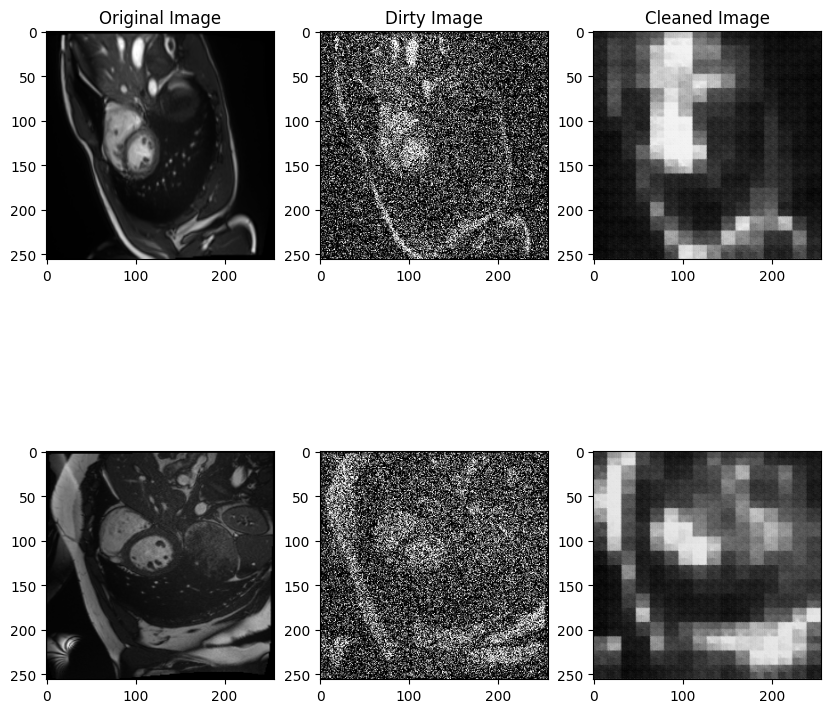

--------------------------------------------------------------


100%|██████████| 119/119 [03:16<00:00,  1.65s/it]


Epoch : 1 	 Train Loss : 0.011 or 0.010790 	 time: 196.670


100%|██████████| 23/23 [00:16<00:00,  1.37it/s]


Epoch : 1 	 Val Loss : 0.010 or 0.009590 	 Test Acc : 38208080.000000 	 time: 16.820


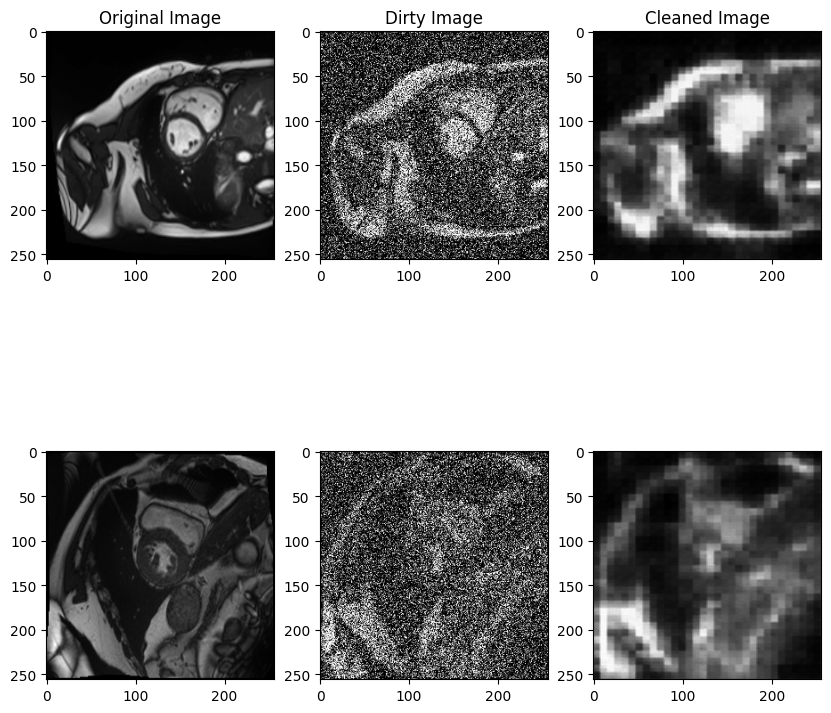

--------------------------------------------------------------


100%|██████████| 119/119 [03:39<00:00,  1.85s/it]


Epoch : 2 	 Train Loss : 0.009 or 0.008769 	 time: 219.701


100%|██████████| 23/23 [00:18<00:00,  1.25it/s]


Epoch : 2 	 Val Loss : 0.009 or 0.009128 	 Test Acc : 38208080.000000 	 time: 18.500


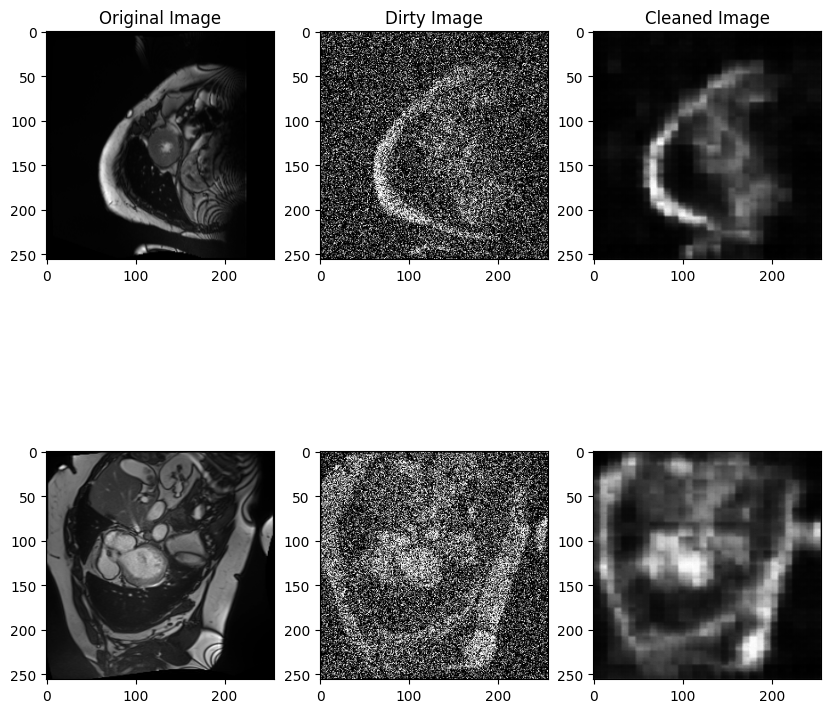

--------------------------------------------------------------


100%|██████████| 119/119 [03:31<00:00,  1.78s/it]


Epoch : 3 	 Train Loss : 0.008 or 0.008270 	 time: 211.520


100%|██████████| 23/23 [00:17<00:00,  1.33it/s]


Epoch : 3 	 Val Loss : 0.008 or 0.008034 	 Test Acc : 38208080.000000 	 time: 17.394


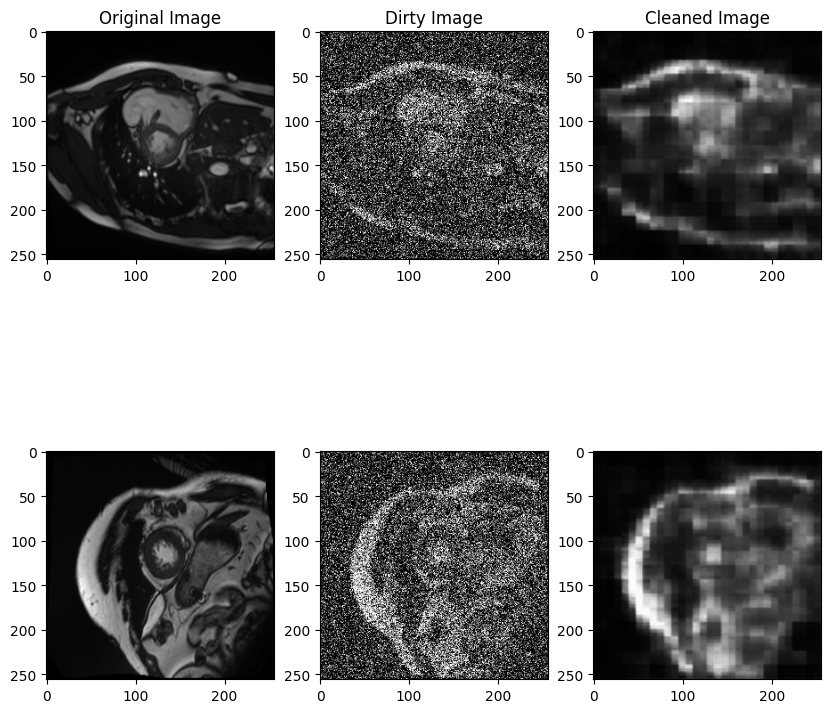

--------------------------------------------------------------


100%|██████████| 119/119 [03:27<00:00,  1.74s/it]


Epoch : 4 	 Train Loss : 0.008 or 0.007852 	 time: 207.406


100%|██████████| 23/23 [00:16<00:00,  1.38it/s]


Epoch : 4 	 Val Loss : 0.008 or 0.007768 	 Test Acc : 38208080.000000 	 time: 16.697


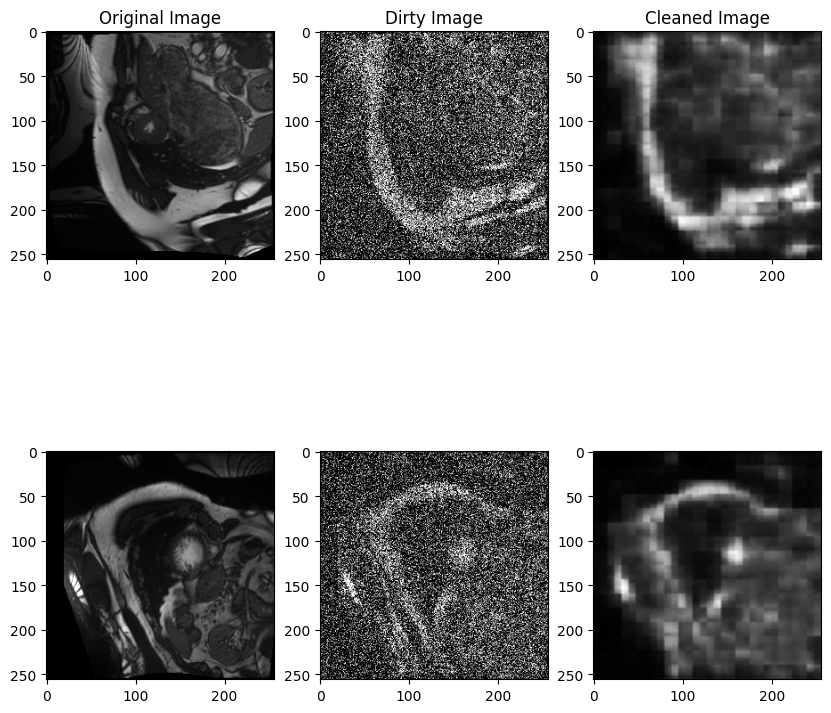

--------------------------------------------------------------


100%|██████████| 119/119 [03:32<00:00,  1.79s/it]


Epoch : 5 	 Train Loss : 0.008 or 0.007629 	 time: 212.771


100%|██████████| 23/23 [00:18<00:00,  1.26it/s]


Epoch : 5 	 Val Loss : 0.008 or 0.007622 	 Test Acc : 38208080.000000 	 time: 18.238


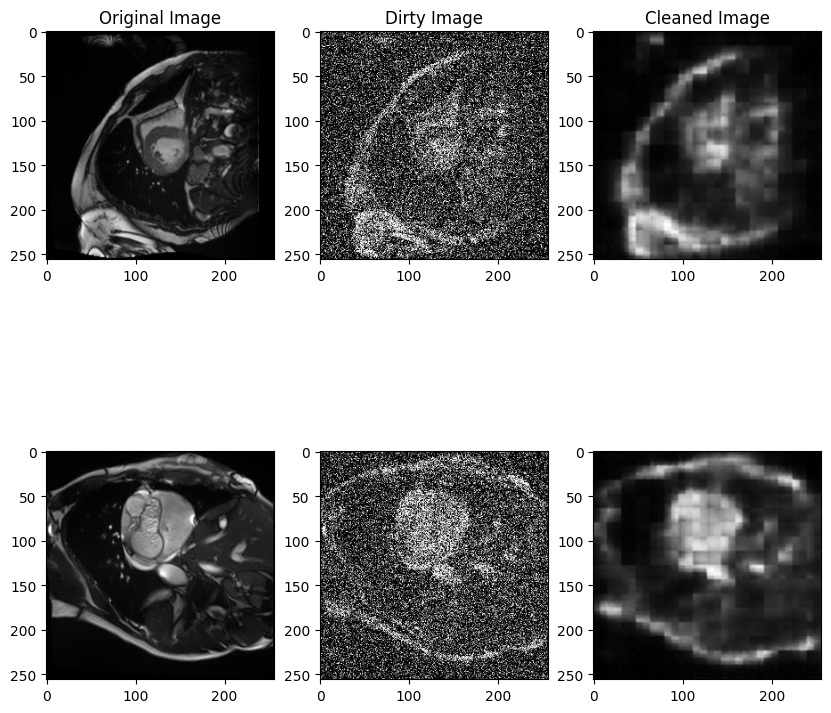

--------------------------------------------------------------


100%|██████████| 119/119 [03:32<00:00,  1.79s/it]


Epoch : 6 	 Train Loss : 0.007 or 0.007475 	 time: 212.428


100%|██████████| 23/23 [00:17<00:00,  1.35it/s]


Epoch : 6 	 Val Loss : 0.007 or 0.007466 	 Test Acc : 38212756.000000 	 time: 17.113


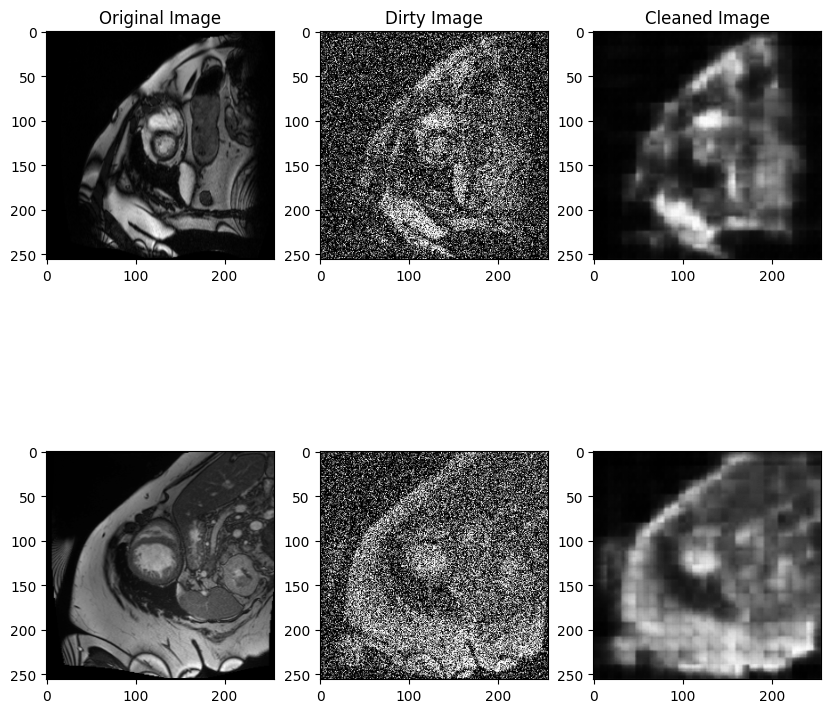

--------------------------------------------------------------


100%|██████████| 119/119 [03:30<00:00,  1.77s/it]


Epoch : 7 	 Train Loss : 0.007 or 0.007299 	 time: 210.483


100%|██████████| 23/23 [00:17<00:00,  1.31it/s]


Epoch : 7 	 Val Loss : 0.007 or 0.007296 	 Test Acc : 38212756.000000 	 time: 17.660


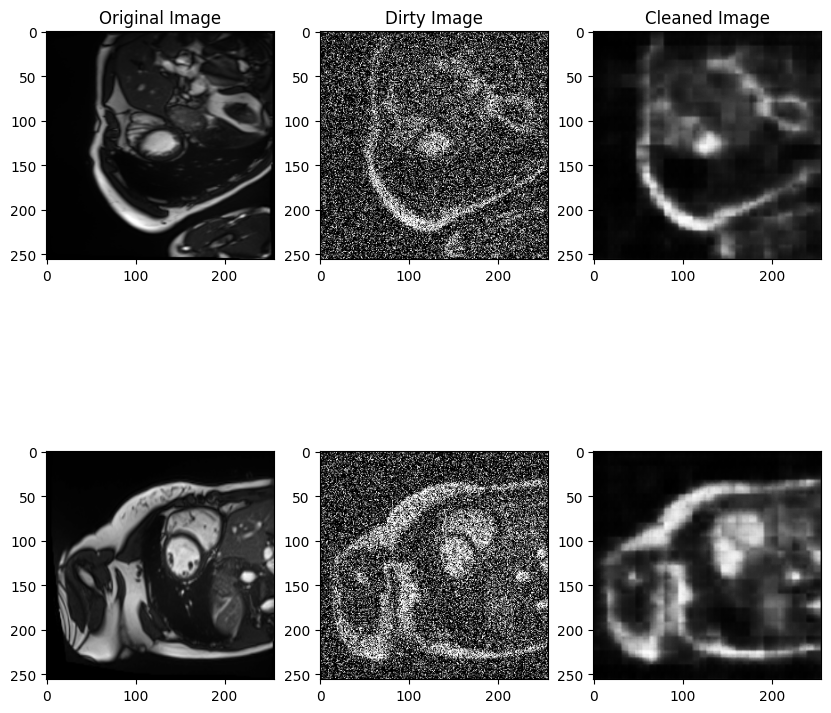

--------------------------------------------------------------


100%|██████████| 119/119 [03:38<00:00,  1.83s/it]


Epoch : 8 	 Train Loss : 0.007 or 0.007245 	 time: 218.251


100%|██████████| 23/23 [00:18<00:00,  1.27it/s]


Epoch : 8 	 Val Loss : 0.007 or 0.007260 	 Test Acc : 38212756.000000 	 time: 18.193


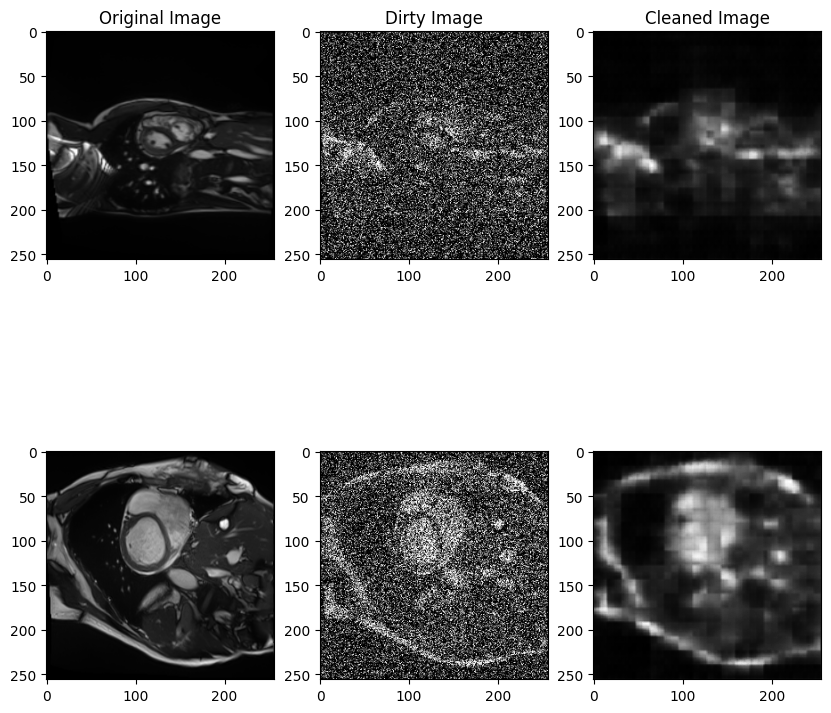

--------------------------------------------------------------


100%|██████████| 119/119 [03:36<00:00,  1.82s/it]


Epoch : 9 	 Train Loss : 0.007 or 0.007149 	 time: 216.368


100%|██████████| 23/23 [00:17<00:00,  1.30it/s]


Epoch : 9 	 Val Loss : 0.007 or 0.007184 	 Test Acc : 38212756.000000 	 time: 17.765


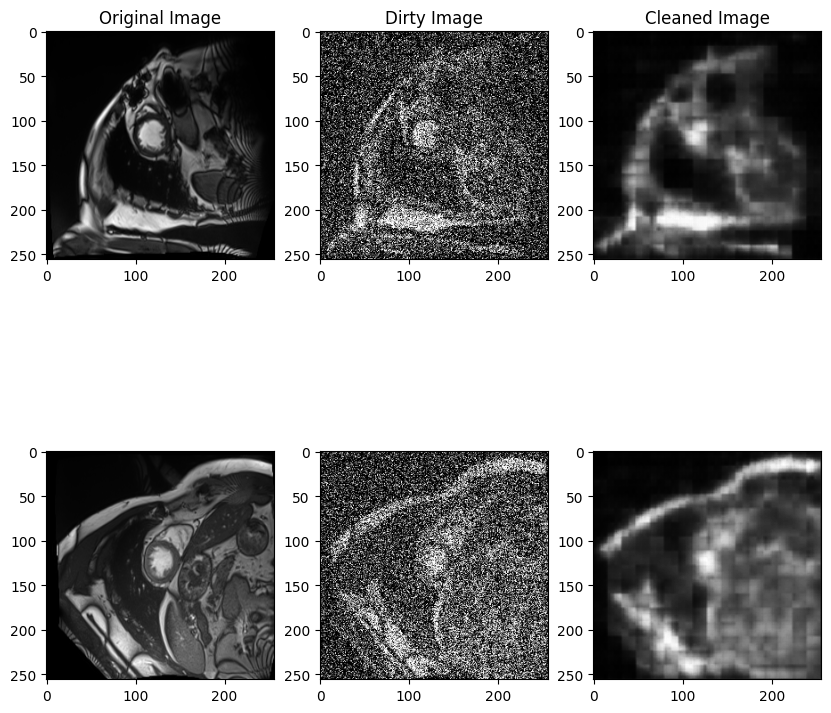

--------------------------------------------------------------


100%|██████████| 119/119 [03:46<00:00,  1.90s/it]


Epoch : 10 	 Train Loss : 0.007 or 0.007084 	 time: 226.082


100%|██████████| 23/23 [00:17<00:00,  1.34it/s]


Epoch : 10 	 Val Loss : 0.007 or 0.007114 	 Test Acc : 38212756.000000 	 time: 17.200


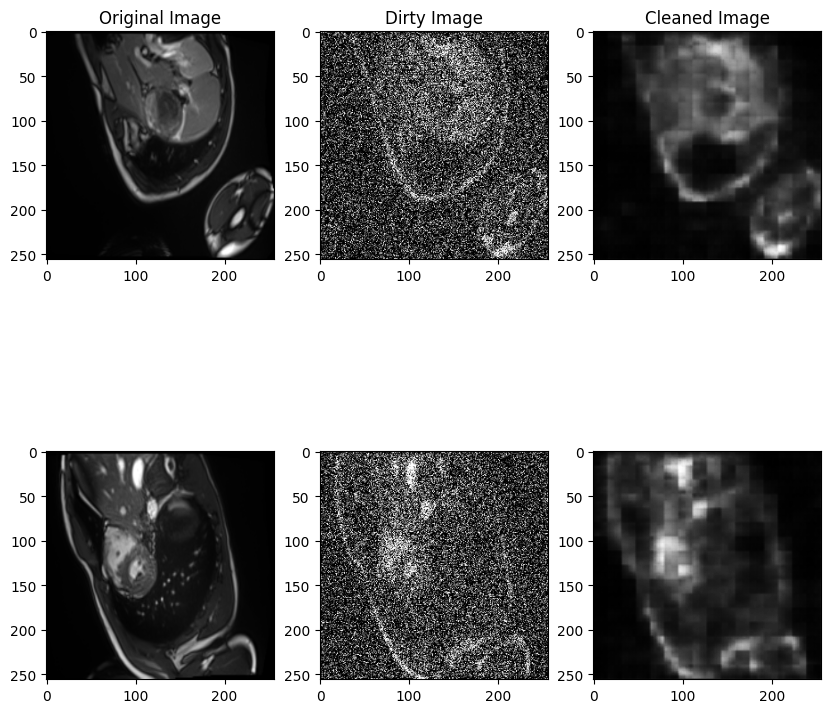

--------------------------------------------------------------


100%|██████████| 119/119 [04:08<00:00,  2.09s/it]


Epoch : 11 	 Train Loss : 0.007 or 0.007028 	 time: 248.433


100%|██████████| 23/23 [00:16<00:00,  1.36it/s]


Epoch : 11 	 Val Loss : 0.007 or 0.007089 	 Test Acc : 38212756.000000 	 time: 16.992


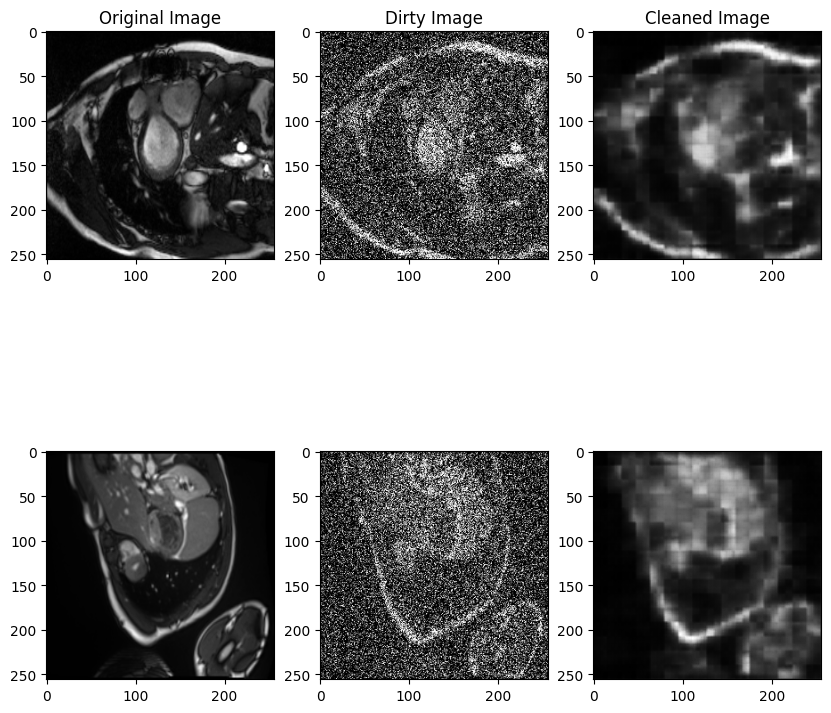

--------------------------------------------------------------


100%|██████████| 119/119 [04:32<00:00,  2.29s/it]


Epoch : 12 	 Train Loss : 0.007 or 0.006961 	 time: 272.302


100%|██████████| 23/23 [00:30<00:00,  1.34s/it]


Epoch : 12 	 Val Loss : 0.007 or 0.007010 	 Test Acc : 38212756.000000 	 time: 30.823


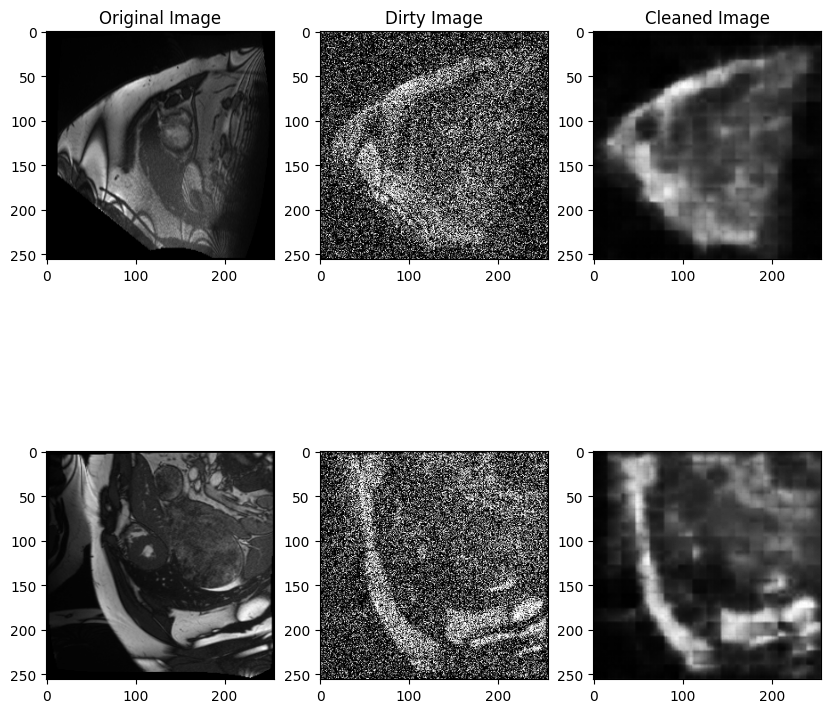

--------------------------------------------------------------


100%|██████████| 119/119 [06:07<00:00,  3.09s/it]


Epoch : 13 	 Train Loss : 0.007 or 0.006950 	 time: 367.216


100%|██████████| 23/23 [00:45<00:00,  2.00s/it]


Epoch : 13 	 Val Loss : 0.007 or 0.007032 	 Test Acc : 38212756.000000 	 time: 46.043


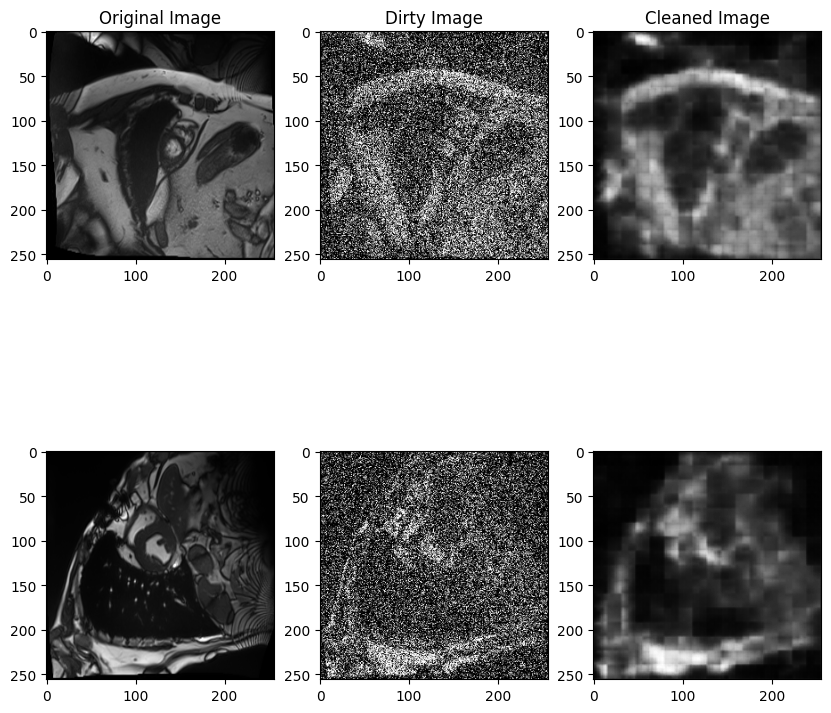

--------------------------------------------------------------


100%|██████████| 119/119 [06:30<00:00,  3.29s/it]


Epoch : 14 	 Train Loss : 0.007 or 0.007212 	 time: 390.981


100%|██████████| 23/23 [00:39<00:00,  1.72s/it]


Epoch : 14 	 Val Loss : 0.007 or 0.006955 	 Test Acc : 38212756.000000 	 time: 39.653


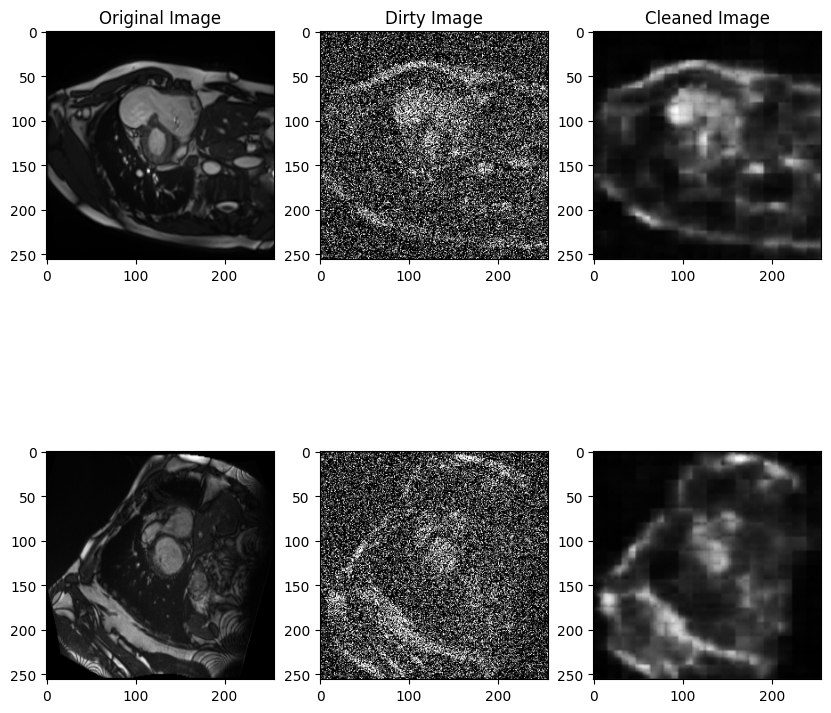

--------------------------------------------------------------


100%|██████████| 119/119 [06:38<00:00,  3.35s/it]


Epoch : 15 	 Train Loss : 0.007 or 0.006818 	 time: 398.738


100%|██████████| 23/23 [00:40<00:00,  1.77s/it]


Epoch : 15 	 Val Loss : 0.007 or 0.006901 	 Test Acc : 38212756.000000 	 time: 40.672


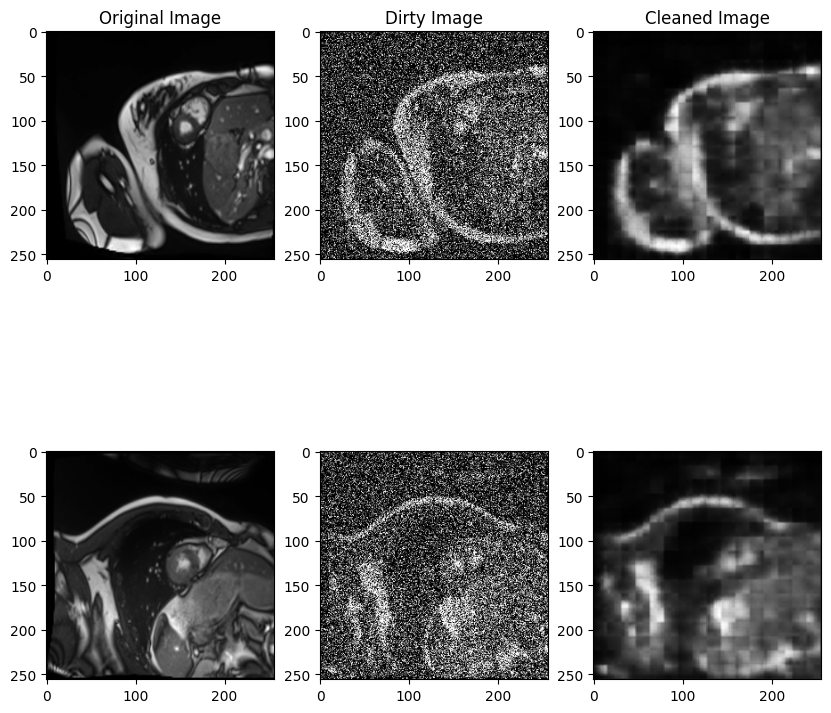

--------------------------------------------------------------


100%|██████████| 119/119 [06:45<00:00,  3.41s/it]


Epoch : 16 	 Train Loss : 0.007 or 0.006774 	 time: 405.940


100%|██████████| 23/23 [00:41<00:00,  1.79s/it]


Epoch : 16 	 Val Loss : 0.007 or 0.006873 	 Test Acc : 38212756.000000 	 time: 41.162


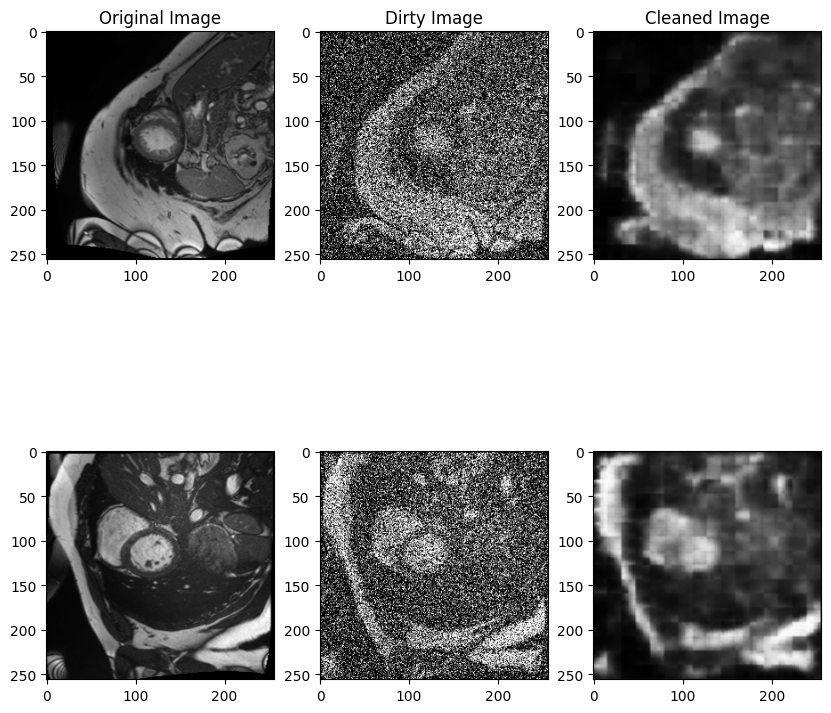

--------------------------------------------------------------


100%|██████████| 119/119 [06:44<00:00,  3.40s/it]


Epoch : 17 	 Train Loss : 0.007 or 0.006748 	 time: 404.766


100%|██████████| 23/23 [00:40<00:00,  1.77s/it]


Epoch : 17 	 Val Loss : 0.007 or 0.006883 	 Test Acc : 38212756.000000 	 time: 40.801


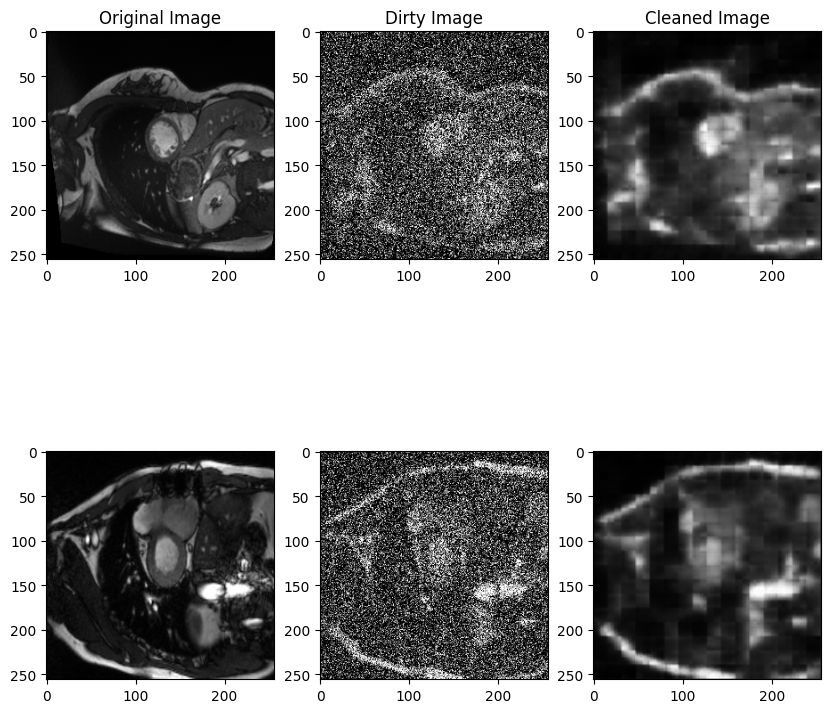

--------------------------------------------------------------


100%|██████████| 119/119 [06:38<00:00,  3.35s/it]


Epoch : 18 	 Train Loss : 0.007 or 0.006737 	 time: 398.103


100%|██████████| 23/23 [00:40<00:00,  1.78s/it]


Epoch : 18 	 Val Loss : 0.007 or 0.006830 	 Test Acc : 38212756.000000 	 time: 40.911


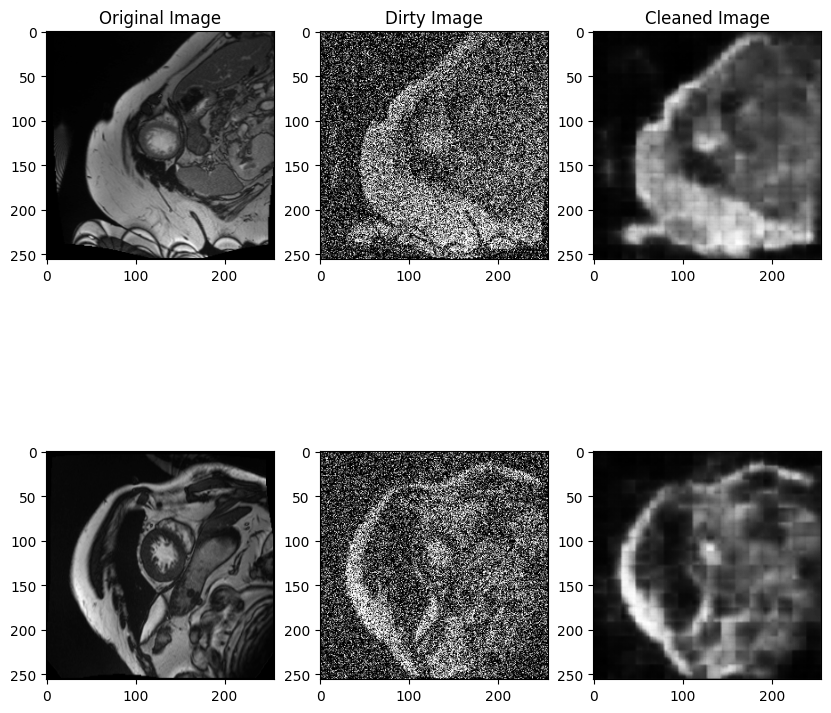

--------------------------------------------------------------


100%|██████████| 119/119 [06:32<00:00,  3.30s/it]


Epoch : 19 	 Train Loss : 0.007 or 0.006697 	 time: 392.794


100%|██████████| 23/23 [00:42<00:00,  1.85s/it]


Epoch : 19 	 Val Loss : 0.007 or 0.006842 	 Test Acc : 38212756.000000 	 time: 42.631


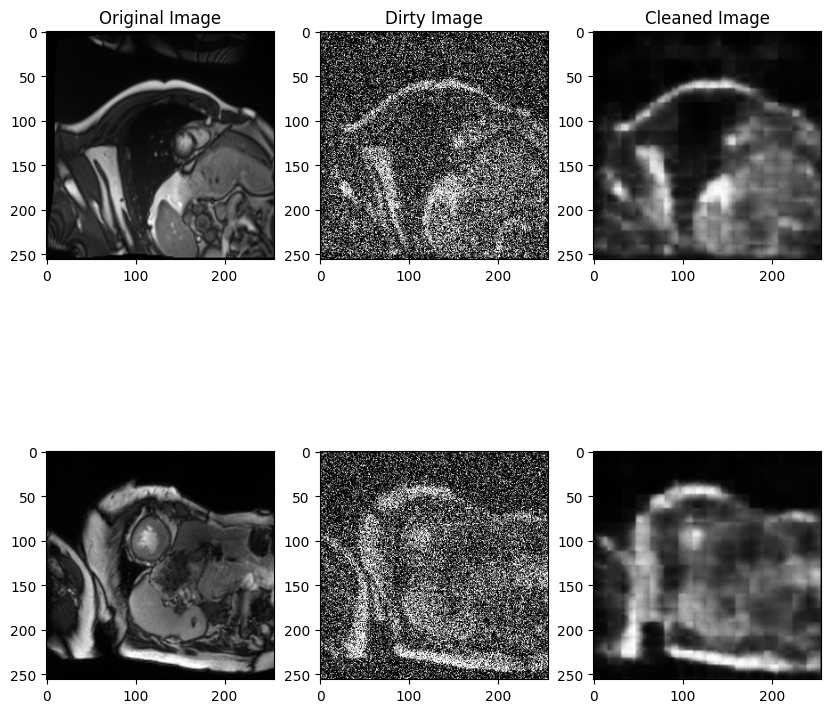

--------------------------------------------------------------


In [189]:
for epoch in range(epochs):
        
    TRlosses, timer = training(net, TRloader, TRnoisedLoader, criterion, optimizer, test, noise_factor, losses_TRAll)
    
    losses_TR.append(np.mean(TRlosses))
    idxEpoch.append(idxEpoch[-1] + len(TRlosses))
    print('Epoch : %d \t Train Loss : %.3f \t time: %.3f' % (epoch, np.mean(TRlosses), timer))
    
    
    VAlosses, timer = validation(net, VAloader, VAnoisedLoader, criterion, test, noise_factor)
    
    losses_VA.append(np.mean(VAlosses))
    print('Epoch : %d \t Val Loss : %.3f \t time: %.3f' % (epoch, np.mean(VAlosses), timer))
    plot_ae_outputs_den(net, TEloader, TEnoisedLoader, size, n, n_tot3, batch_size, test, noise_factor)
    print('--------------------------------------------------------------')

#### Testing cycle

In [190]:
for epoch in range(epochs):
    TElosses, timer = testing(net, TEloader, TEnoisedLoader, criterion, test, noise_factor)
    
    losses_TE.append(np.mean(TElosses))
    print('Epoch : %d \t Test Loss : %3f \t time : %3f' % (epoch, np.mean(TElosses), timer))
    print('--------------------------------------------------------------')

100%|██████████| 45/45 [01:19<00:00,  1.78s/it]


Epoch : 0 	 Test Loss : 0.136778 	 time : 79.980318
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 1 	 Test Loss : 0.136793 	 time : 81.848647
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 2 	 Test Loss : 0.136794 	 time : 82.574809
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 3 	 Test Loss : 0.136779 	 time : 82.215447
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 4 	 Test Loss : 0.136751 	 time : 82.354483
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 5 	 Test Loss : 0.136792 	 time : 82.171802
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 6 	 Test Loss : 0.136785 	 time : 81.855221
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 7 	 Test Loss : 0.136807 	 time : 81.559646
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.84s/it]


Epoch : 8 	 Test Loss : 0.136788 	 time : 82.717761
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 9 	 Test Loss : 0.136796 	 time : 81.340657
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 10 	 Test Loss : 0.136803 	 time : 81.867247
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 11 	 Test Loss : 0.136768 	 time : 82.201483
--------------------------------------------------------------


100%|██████████| 45/45 [01:20<00:00,  1.80s/it]


Epoch : 12 	 Test Loss : 0.136794 	 time : 80.892962
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 13 	 Test Loss : 0.136723 	 time : 81.655504
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 14 	 Test Loss : 0.136803 	 time : 82.319726
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.82s/it]


Epoch : 15 	 Test Loss : 0.136758 	 time : 82.088053
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 16 	 Test Loss : 0.136774 	 time : 82.368674
--------------------------------------------------------------


100%|██████████| 45/45 [01:23<00:00,  1.85s/it]


Epoch : 17 	 Test Loss : 0.136834 	 time : 83.316564
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 18 	 Test Loss : 0.136791 	 time : 81.758832
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]

Epoch : 19 	 Test Loss : 0.136818 	 time : 81.869097
--------------------------------------------------------------


## Step 3
### Plot learning curves

In [191]:
dlossesTRAll = {}
dlossesTR = {}
dlossesTE = {}
dlossesVA = {}
didxEpoch = {}
dnbParam = {}

In [1]:
# to store losses for all epochs / iterations
dlossesTE[test_name] = losses_TE
dlossesVA[test_name] = losses_VA
dlossesTR[test_name] = losses_TR
dlossesTRAll[test_name] = losses_TRAll
didxEpoch[test_name] = idxEpoch
dnbParam[test_name] = count_parameters(net)

test_list = ['autoencoder_lr0_1.0e-03'] # ajouter dans cette liste le nom des reseaux que vous tester 

for n in test_list: 
    if n in dlossesTR:
        print ('----------------------------------------------------------------------------')
        print ('----------------------------------------------------------------------------')
        print ('----------------------------------------------------------------------------')
        print (n)
        print ('best loss on train : ' + str(np.min(dlossesTR[n])) + ' idx ' + str(np.argmin(dlossesTR[n])))
        print ('best loss on val   : ' + str(np.min(dlossesVA[n])) + ' idx ' + str(np.argmin(dlossesVA[n])))
        print ('best loss on test  : ' + str(np.min(dlossesTE[n])) + ' idx ' + str(np.argmin(dlossesTE[n])))
        print ('n param              : ' + str(dnbParam[n]))

        # evenly sampled time at 200ms intervals
        t = np.arange(0, len(dlossesTRAll[n]))

        _, axes = plt.subplots(1,2, figsize=(15,7))
        
        axes[0].set_title("Train, Val and Test losses " + n)
        axes[1].set_title("All Train losses")
        
        axes[0].plot(didxEpoch[n][1:], dlossesTR[n], 'ro', didxEpoch[n][1:], dlossesVA[n], 'gs', didxEpoch[n][1:], dlossesTE[n], 'mx')
        axes[1].plot(t, dlossesTRAll[n], 'b')
        
        plt.show()

NameError: name 'losses_TE' is not defined